<a href="https://colab.research.google.com/github/imabari/rakuten_tools/blob/main/ehime_rakuten_mesh.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install geopandas
!pip install rtree
!pip install pygeos
!pip install -U folium

     |████████████████████████████████| 1.0 MB 5.1 MB/s 
     |████████████████████████████████| 15.4 MB 114 kB/s 
     |████████████████████████████████| 6.3 MB 253 kB/s 
     |████████████████████████████████| 994 kB 6.3 MB/s 
     |████████████████████████████████| 2.1 MB 5.1 MB/s 
     |████████████████████████████████| 95 kB 2.4 MB/s 
  Attempting uninstall: folium
    Found existing installation: folium 0.8.3
    Uninstalling folium-0.8.3:
      Successfully uninstalled folium-0.8.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
datascience 0.10.6 requires folium==0.2.1, but you have folium 0.12.1.post1 which is incompatible.


In [2]:
!wget https://nlftp.mlit.go.jp/ksj/gml/data/N03/N03-2021/N03-20210101_38_GML.zip

--2021-12-20 01:57:50--  https://nlftp.mlit.go.jp/ksj/gml/data/N03/N03-2021/N03-20210101_38_GML.zip
Resolving nlftp.mlit.go.jp (nlftp.mlit.go.jp)... 192.29.105.247, 147.154.116.181, 192.29.107.131
Connecting to nlftp.mlit.go.jp (nlftp.mlit.go.jp)|192.29.105.247|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 14550007 (14M) [application/zip]
Saving to: ‘N03-20210101_38_GML.zip’

N03-20210101_38_GML 100%[===================>]  13.88M  12.3MB/s    in 1.1s    

2021-12-20 01:57:53 (12.3 MB/s) - ‘N03-20210101_38_GML.zip’ saved [14550007/14550007]



In [3]:
import pandas as pd
import geopandas as gpd

/usr/local/lib/python3.7/dist-packages/geopandas/_compat.py:115: UserWarning: The Shapely GEOS version (3.9.1-CAPI-1.14.2) is incompatible with the GEOS version PyGEOS was compiled with (3.10.1-CAPI-1.16.0). Conversions between both will be slow.
  shapely_geos_version, geos_capi_version_string


In [4]:
import matplotlib.pyplot as plt

# 解像度
import matplotlib as mpl
mpl.rcParams["figure.dpi"] = 200

# 市区町村で結合

https://geopandas.org/en/stable/docs/user_guide/aggregation_with_dissolve.html

In [5]:
temp = gpd.read_file("N03-20210101_38_GML.zip!N03-20210101_38_GML").rename(columns={"N03_007": "SHICODE", "N03_004": "NAME"})
temp["SHICODE"] = temp["SHICODE"].astype(int)
ehime = temp.dropna(subset=["SHICODE"]).dissolve(by="SHICODE")
ehime

,geometry,N03_001,N03_002,N03_003,NAME
SHICODE,,,,,
38201,"MULTIPOLYGON (((132.52996 33.84425, 132.53000 ...",愛媛県,None,None,松山市
38202,"MULTIPOLYGON (((132.81523 34.02308, 132.81519 ...",愛媛県,None,None,今治市
38203,"MULTIPOLYGON (((132.26563 33.16799, 132.26564 ...",愛媛県,None,None,宇和島市
38204,"MULTIPOLYGON (((132.35818 33.36854, 132.35820 ...",愛媛県,None,None,八幡浜市
38205,"MULTIPOLYGON (((133.32149 33.99421, 133.32151 ...",愛媛県,None,None,新居浜市
38206,"MULTIPOLYGON (((133.10450 33.95198, 133.10450 ...",愛媛県,None,None,西条市
38207,"MULTIPOLYGON (((132.42617 33.55354, 132.42614 ...",愛媛県,None,None,大洲市
38210,"MULTIPOLYGON (((132.58131 33.65392, 132.58120 ...",愛媛県,None,None,伊予市
38213,"MULTIPOLYGON (((133.59910 34.04237, 133.59914 ...",愛媛県,None,None,四国中央市


In [6]:
ehime.crs

<Geographic 2D CRS: EPSG:6668>
Name: JGD2011
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: Japan - onshore and offshore.
- bounds: (122.38, 17.09, 157.65, 46.05)
Datum: Japanese Geodetic Datum 2011
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

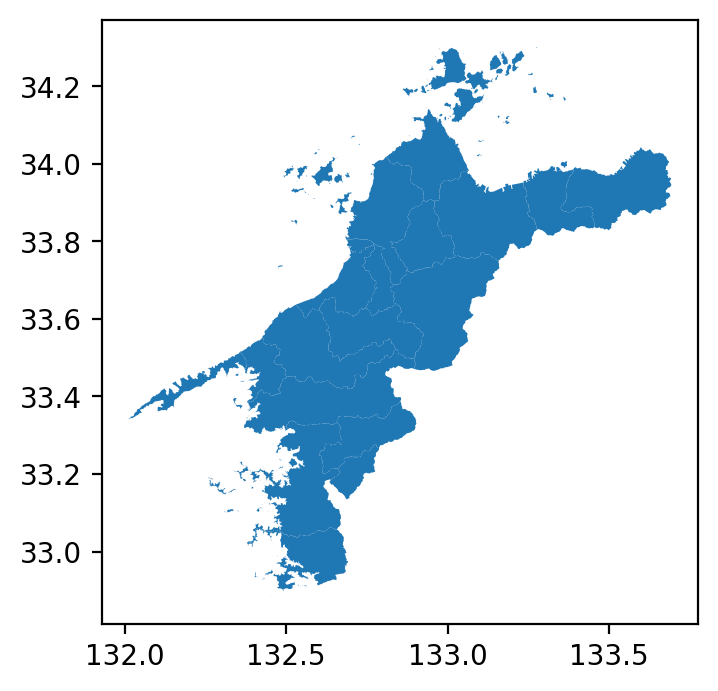

In [7]:
ehime.plot()

# メッシュ人口

In [8]:
!wget "https://nlftp.mlit.go.jp/ksj/gml/data/m500h30/m500h30-18/500m_mesh_suikei_2018_shape_38.zip" -O 500m_mesh_suikei_2018_shape_38.zip

--2021-12-20 01:58:12--  https://nlftp.mlit.go.jp/ksj/gml/data/m500h30/m500h30-18/500m_mesh_suikei_2018_shape_38.zip
Resolving nlftp.mlit.go.jp (nlftp.mlit.go.jp)... 147.154.99.182, 147.154.112.73, 192.29.105.247
Connecting to nlftp.mlit.go.jp (nlftp.mlit.go.jp)|147.154.99.182|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 4765460 (4.5M) [application/zip]
Saving to: ‘500m_mesh_suikei_2018_shape_38.zip’

500m_mesh_suikei_20 100%[===================>]   4.54M  4.41MB/s    in 1.0s    

2021-12-20 01:58:14 (4.41 MB/s) - ‘500m_mesh_suikei_2018_shape_38.zip’ saved [4765460/4765460]



In [9]:
gdf_mesh = gpd.read_file("500m_mesh_suikei_2018_shape_38.zip").loc[:, ["MESH_ID", "SHICODE", "PTN_2015", "geometry"]]
gdf_mesh

,MESH_ID,SHICODE,PTN_2015,geometry
0,493223994,38506,190.4832,"POLYGON ((132.49375 32.91250, 132.49375 32.916..."
1,493224903,38506,90.2026,"POLYGON ((132.50000 32.91250, 132.50000 32.916..."
2,493224904,38506,53.1617,"POLYGON ((132.50625 32.91250, 132.50625 32.916..."
3,493224911,38506,84.3426,"POLYGON ((132.51250 32.90833, 132.51250 32.912..."
4,493224912,38506,7.0295,"POLYGON ((132.51875 32.90833, 132.51875 32.912..."
...,...,...,...,...
8005,513331471,38356,26.9282,"POLYGON ((133.21250 34.28333, 133.21250 34.287..."
8006,513331472,38356,50.2501,"POLYGON ((133.21875 34.28333, 133.21875 34.287..."
8007,513331474,38356,65.4893,"POLYGON ((133.21875 34.28750, 133.21875 34.291..."
8008,513331481,38356,29.1477,"POLYGON ((133.22500 34.28333, 133.22500 34.287..."


In [10]:
gdf_mesh.crs

<Geographic 2D CRS: EPSG:4612>
Name: JGD2000
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: Japan - onshore and offshore.
- bounds: (122.38, 17.09, 157.65, 46.05)
Datum: Japanese Geodetic Datum 2000
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

In [11]:
# 人口合計
gdf_mesh["PTN_2015"].sum()

1385262.0003999998

In [12]:
gdf_mesh

,MESH_ID,SHICODE,PTN_2015,geometry
0,493223994,38506,190.4832,"POLYGON ((132.49375 32.91250, 132.49375 32.916..."
1,493224903,38506,90.2026,"POLYGON ((132.50000 32.91250, 132.50000 32.916..."
2,493224904,38506,53.1617,"POLYGON ((132.50625 32.91250, 132.50625 32.916..."
3,493224911,38506,84.3426,"POLYGON ((132.51250 32.90833, 132.51250 32.912..."
4,493224912,38506,7.0295,"POLYGON ((132.51875 32.90833, 132.51875 32.912..."
...,...,...,...,...
8005,513331471,38356,26.9282,"POLYGON ((133.21250 34.28333, 133.21250 34.287..."
8006,513331472,38356,50.2501,"POLYGON ((133.21875 34.28333, 133.21875 34.287..."
8007,513331474,38356,65.4893,"POLYGON ((133.21875 34.28750, 133.21875 34.291..."
8008,513331481,38356,29.1477,"POLYGON ((133.22500 34.28333, 133.22500 34.287..."


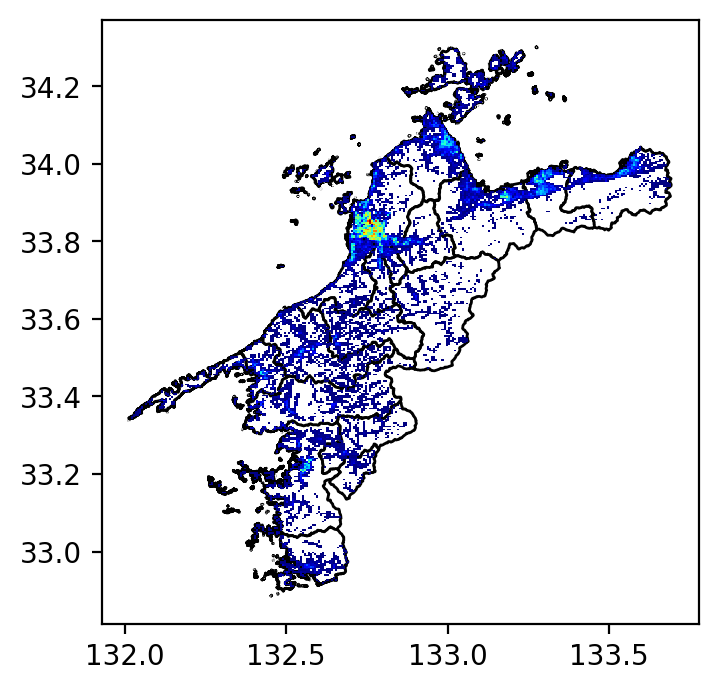

In [13]:
base = ehime.plot(color="white", edgecolor="black")
gdf_mesh.plot(ax=base, column="PTN_2015", cmap="jet")

# メッシュ確認

In [14]:
import folium

In [15]:
map = folium.Map(location=[34.06604300, 132.99765800], zoom_start=12)

In [16]:
# コロプレス
choropleth = folium.Choropleth(
    geo_data=gdf_mesh.to_json(),
    data=gdf_mesh,
    columns=["MESH_ID", "PTN_2015"],
    fill_color="OrRd",
    key_on="feature.properties.MESH_ID",
    threshold_scale=[0, 250, 500, 1000, 1500, 2000, 3000, 4000, 5000],
)
choropleth.add_to(map)

In [17]:
# ポップアップ追加
gjson = folium.GeoJson(gdf_mesh).add_to(map)
folium.features.GeoJsonPopup(fields=["PTN_2015"], labels=False).add_to(gjson)

In [18]:
map

In [19]:
gdf_mesh.to_crs(epsg=6672, inplace=True)
ehime.to_crs(epsg=6672, inplace=True)

In [20]:
gdf_point = gdf_mesh.copy()

In [21]:
gdf_point.crs

<Projected CRS: EPSG:6672>
Name: JGD2011 / Japan Plane Rectangular CS IV
Axis Info [cartesian]:
- X[north]: Northing (metre)
- Y[east]: Easting (metre)
Area of Use:
- name: Japan - onshore - Shikoku - Kagawa-ken; Ehime-ken; Tokushima-ken; Kochi-ken.
- bounds: (131.95, 32.69, 134.81, 34.45)
Coordinate Operation:
- name: Japan Plane Rectangular CS zone IV
- method: Transverse Mercator
Datum: Japanese Geodetic Datum 2011
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

In [22]:
# メッシュ中心
gdf_point["geometry"] = gdf_point["geometry"].centroid
gdf_point

,MESH_ID,SHICODE,PTN_2015,geometry
0,493223994,38506,190.4832,POINT (-93828.077 -9025.728)
1,493224903,38506,90.2026,POINT (-93243.454 -9031.273)
2,493224904,38506,53.1617,POINT (-92658.831 -9036.783)
3,493224911,38506,84.3426,POINT (-92078.523 -9504.336)
4,493224912,38506,7.0295,POINT (-91493.874 -9509.777)
...,...,...,...,...
8005,513331471,38356,26.9282,POINT (-26181.151 142595.579)
8006,513331472,38356,50.2501,POINT (-25605.739 142593.988)
8007,513331474,38356,65.4893,POINT (-25604.476 143056.142)
8008,513331481,38356,29.1477,POINT (-25030.328 142592.432)


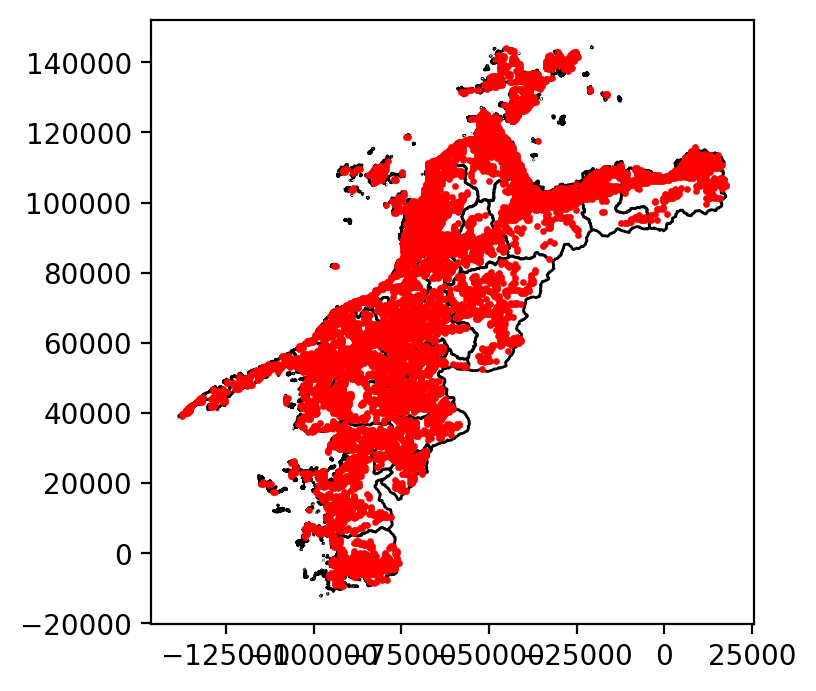

In [23]:
base = ehime.plot(color="white", edgecolor="black")
gdf_point.plot(ax=base, marker="o", color="red", markersize=2)

In [24]:
# 市町村ごとの人口集計
se_point = gdf_point.groupby("SHICODE")["PTN_2015"].sum()
se_point.name = "人口"

# 基地局データ

In [25]:
# スプレッドシートのURL
url = "https://docs.google.com/spreadsheets/d/e/2PACX-1vRE1NoYtNw1FmjRQ8wcdPkcE0Ryeoc2mfFkCQPHjzwL5CpwNKkLXnBl_F7c0LZjrtbLtRLH55ZVi6gQ/pub?gid=0&single=true&output=csv"

In [26]:
df0 = pd.read_csv(url, index_col=0).dropna(how="all").rename(columns={"緯度":"lat", "経度": "lng"})

In [27]:
pt_df = gpd.GeoDataFrame(df0, geometry = gpd.points_from_xy(df0.lng, df0.lat), crs="EPSG:6668")

In [28]:
pt_df.to_crs(epsg=6672, inplace=True)

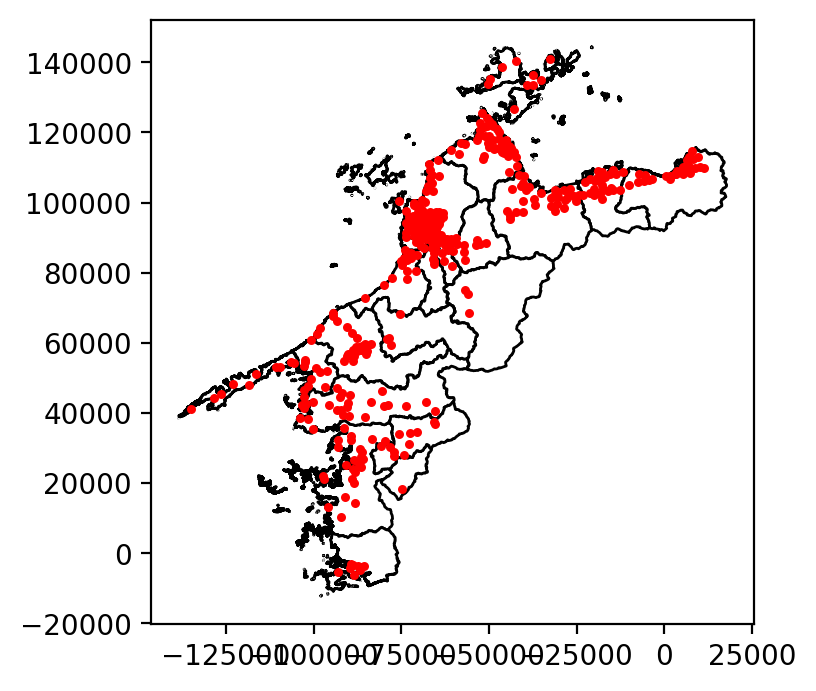

In [29]:
base = ehime.plot(color="white", edgecolor="black")
pt_df.plot(ax=base, marker="o", color="red", markersize=5)

In [30]:
# TA10 = 780
circles = pt_df.geometry.buffer(780)
circles

番号
1      POLYGON ((-45446.959 116818.210, -45450.715 11...
2      POLYGON ((-46187.236 115176.527, -46190.992 11...
3      POLYGON ((-41569.507 112927.195, -41573.263 11...
4      POLYGON ((-43892.490 113173.022, -43896.246 11...
5      POLYGON ((-48066.568 117816.259, -48070.324 11...
                             ...                        
410    POLYGON ((-87963.474 -3405.457, -87967.230 -34...
411    POLYGON ((-88547.415 -3032.846, -88551.171 -31...
412    POLYGON ((-85664.716 -4026.921, -85668.472 -41...
413    POLYGON ((-85933.868 -4798.686, -85937.624 -48...
414    POLYGON ((-92291.537 -5281.323, -92295.293 -53...
Length: 414, dtype: geometry

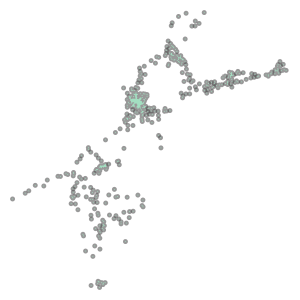

In [31]:
mp = circles.unary_union
mp

In [32]:
# 円内除去
gdf_point["point"] = gdf_point["geometry"].difference(mp)

In [33]:
# 円内の人口を抽出
gdf_cover = gdf_point[gdf_point["point"].is_empty].copy()

In [34]:
# カバー人口
se_cover = gdf_cover.groupby("SHICODE")["PTN_2015"].sum()
se_cover.name = "カバー人口"

In [35]:
df_jinko = pd.concat([se_point, se_cover], axis=1).fillna(0)
df_jinko

,人口,カバー人口
SHICODE,,
38201,514865.0010,471315.3894
38202,158114.0003,104137.2876
38203,77465.0021,43669.6352
38204,34951.0004,12749.0978
38205,119902.9997,86616.2553
38206,108174.0000,56090.8455
38207,44086.0009,29796.4174
38210,36826.9989,20740.3262
38213,87412.9992,62591.4009


In [38]:
df1 = df_jinko.join(ehime).reindex(columns=["NAME", "人口", "カバー人口"])
df1["カバー率"] = df1["カバー人口"] / df1["人口"] * 100
df1

,NAME,人口,カバー人口,カバー率
SHICODE,,,,
38201,松山市,514865.0010,471315.3894,91.541547
38202,今治市,158114.0003,104137.2876,65.862155
38203,宇和島市,77465.0021,43669.6352,56.373374
38204,八幡浜市,34951.0004,12749.0978,36.477061
38205,新居浜市,119902.9997,86616.2553,72.238606
38206,西条市,108174.0000,56090.8455,51.852428
38207,大洲市,44086.0009,29796.4174,67.587027
38210,伊予市,36826.9989,20740.3262,56.318263
38213,四国中央市,87412.9992,62591.4009,71.604225


In [37]:
df1.to_csv("ehime.tsv", sep="\t", index=False, header=False)